Question 3 (B)

Initial beam width: 399.61 mm
Propagated beam width: 399.61 mm
Width ratio (should be ~2): 1.00
X centroid: -1.26e-14 m
Y centroid: -1.26e-14 m


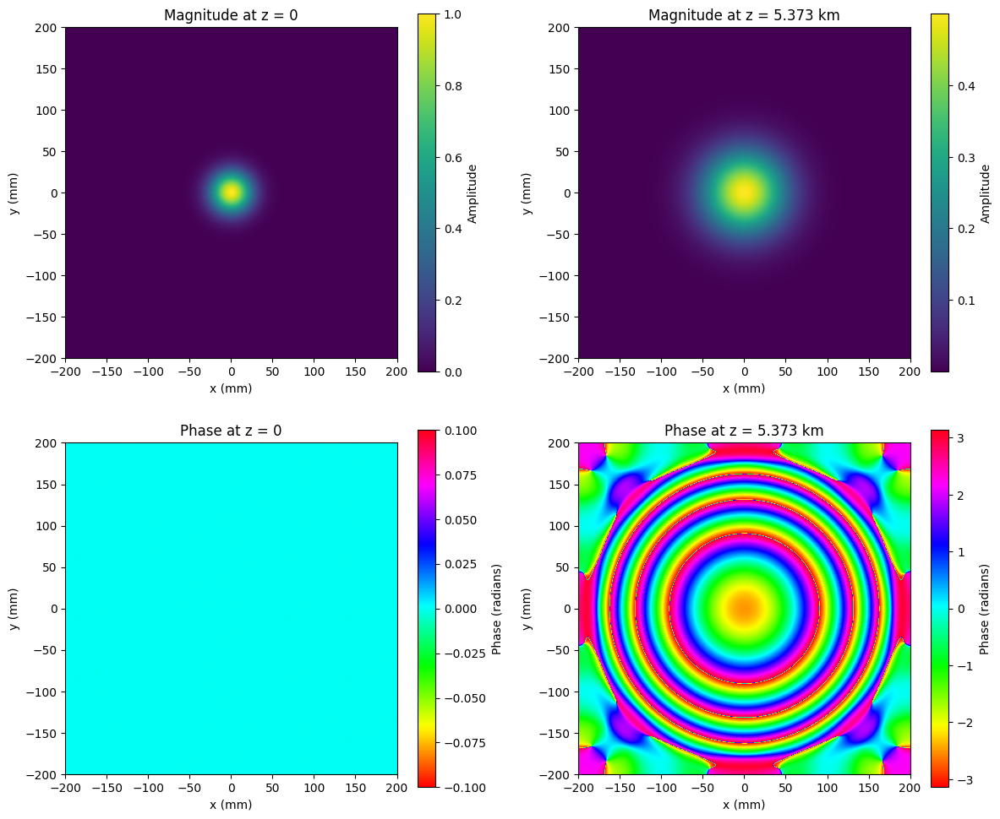

In [15]:
import numpy as np
import matplotlib.pyplot as plt

def angular_spectrum_propagation(E0, wavelength, z, xmax, N):
    """Calculate electric field propagation using angular spectrum method"""
    dx = 2 * xmax / N
    x = np.linspace(-xmax, xmax, N, endpoint=False)
    X, Y = np.meshgrid(x, x)
    
    k = 2 * np.pi / wavelength
    fx = np.fft.fftfreq(N, dx)
    FX, FY = np.meshgrid(fx, fx)
    
    kx = 2 * np.pi * FX
    ky = 2 * np.pi * FY
    kz = np.sqrt(k**2 - kx**2 - ky**2)
    H = np.exp(1j * kz * z)
# Handle evanescent waves (where kx^2 + ky^2 > k^2)
    H[np.isnan(kz) | (kx**2 + ky**2 > k**2)] = 0
    
    U0 = np.fft.fft2(E0)
    U = U0 * H
    E = np.fft.ifft2(U)
    
    mag = np.abs(E)
    phase = np.angle(E)
    return mag, phase, X, Y

def gaussian_beam(xmax, N, w0):
    """Generate initial Gaussian beam field"""
    dx = 2 * xmax / N
    x = np.linspace(-xmax, xmax, N, endpoint=False)
    X, Y = np.meshgrid(x, x)
    return np.exp(-(X**2 + Y**2) / w0**2)

def verify_propagation_with_phase():
    # Parameters
    xmax = 0.20          # 20 cm in meters
    N = 1024             # pixels per side
    wavelength = 633e-9  # 633 nm in meters
    z = 5373             # 5.373 km in meters
    w0 = 0.025           # 25 mm beam waist in meters
    
    # Generate initial field
    E0 = gaussian_beam(xmax, N, w0)
    mag0 = np.abs(E0)
    phase0 = np.angle(E0)  # Phase at z=0 (should be zero for real Gaussian)
    
    # Propagate field
    mag_z, phase_z, X, Y = angular_spectrum_propagation(E0, wavelength, z, xmax, N)
    
    # Calculate beam widths
    center_profile_0 = mag0[N//2, :]
    center_profile_z = mag_z[N//2, :]
    
    max_val_0 = np.max(center_profile_0)
    max_val_z = np.max(center_profile_z)
    threshold_0 = max_val_0 / np.e
    threshold_z = max_val_z / np.e
    
    indices_0 = np.where(center_profile_0 <= threshold_0)[0]
    indices_z = np.where(center_profile_z <= threshold_z)[0]
    x_coords_0 = X[0, indices_0]
    x_coords_z = X[0, indices_z]
    
    width_0 = np.abs(x_coords_0[-1] - x_coords_0[0])
    width_z = np.abs(x_coords_z[-1] - x_coords_z[0])
    
    # Calculate centroid of propagated field
    x_centroid = np.sum(X * mag_z**2) / np.sum(mag_z**2)
    y_centroid = np.sum(Y * mag_z**2) / np.sum(mag_z**2)
    
    # Print results
    print(f"Initial beam width: {width_0*1000:.2f} mm")
    print(f"Propagated beam width: {width_z*1000:.2f} mm")
    print(f"Width ratio (should be ~2): {width_z/width_0:.2f}")
    print(f"X centroid: {x_centroid:.2e} m")
    print(f"Y centroid: {y_centroid:.2e} m")
    
    # Plot 2D magnitude and phase
    fig, axs = plt.subplots(2, 2, figsize=(12, 10))
    
    # Initial magnitude
    im0 = axs[0, 0].imshow(mag0, extent=[-xmax*1000, xmax*1000, -xmax*1000, xmax*1000], cmap='viridis')
    axs[0, 0].set_title('Magnitude at z = 0')
    axs[0, 0].set_xlabel('x (mm)')
    axs[0, 0].set_ylabel('y (mm)')
    plt.colorbar(im0, ax=axs[0, 0], label='Amplitude')
    
    # Propagated magnitude
    im1 = axs[0, 1].imshow(mag_z, extent=[-xmax*1000, xmax*1000, -xmax*1000, xmax*1000], cmap='viridis')
    axs[0, 1].set_title('Magnitude at z = 5.373 km')
    axs[0, 1].set_xlabel('x (mm)')
    axs[0, 1].set_ylabel('y (mm)')
    plt.colorbar(im1, ax=axs[0, 1], label='Amplitude')
    
    # Initial phase
    im2 = axs[1, 0].imshow(phase0, extent=[-xmax*1000, xmax*1000, -xmax*1000, xmax*1000], cmap='hsv')
    axs[1, 0].set_title('Phase at z = 0')
    axs[1, 0].set_xlabel('x (mm)')
    axs[1, 0].set_ylabel('y (mm)')
    plt.colorbar(im2, ax=axs[1, 0], label='Phase (radians)')
    
    # Propagated phase
    im3 = axs[1, 1].imshow(phase_z, extent=[-xmax*1000, xmax*1000, -xmax*1000, xmax*1000], cmap='hsv')
    axs[1, 1].set_title('Phase at z = 5.373 km')
    axs[1, 1].set_xlabel('x (mm)')
    axs[1, 1].set_ylabel('y (mm)')
    plt.colorbar(im3, ax=axs[1, 1], label='Phase (radians)')
    
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    verify_propagation_with_phase()

In [9]:
import numpy as np

def show_sample_frequencies(xmax, N):
    # Calculate pixel size
    dx = 2 * xmax / N  # pixel size in meters
    
    # Spatial frequencies
    fx = np.fft.fftfreq(N, dx)  # frequency coordinates in cycles/meter
    fy = fx
    FX, FY = np.meshgrid(fx, fy)
    
    print(FX[1])
    # Print sample values from FX and FY
    print("Sample FX values (first 5 and last 5 from center row):")
    print(f"FX[{N//2}, 0:5] = {FX[N//2, 0:105]}")
    print(f"FX[{N//2}, -5:] = {FX[N//2, -35:]}")
    
    print("\nSample FY values (first 5 and last 5 from center column):")
    print(f"FY[0:5, {N//2}] = {FY[0:15, N//2]}")
    print(f"FY[-5:, {N//2}] = {FY[-15:, N//2]}")
    
    print(f"\nFX shape: {FX.shape}")
    print(f"FY shape: {FY.shape}")
    print(f"Frequency resolution (df): {fx[1] - fx[0]:.2f} cycles/m")
    print(f"Maximum frequency: {np.max(np.abs(fx)):.2f} cycles/m")

# Parameters from validation case
xmax = 0.20  # 20 cm
N = 1024     # pixels per side

show_sample_frequencies(xmax, N)

[ 0.   2.5  5.  ... -7.5 -5.  -2.5]
Sample FX values (first 5 and last 5 from center row):
FX[512, 0:5] = [  0.    2.5   5.    7.5  10.   12.5  15.   17.5  20.   22.5  25.   27.5
  30.   32.5  35.   37.5  40.   42.5  45.   47.5  50.   52.5  55.   57.5
  60.   62.5  65.   67.5  70.   72.5  75.   77.5  80.   82.5  85.   87.5
  90.   92.5  95.   97.5 100.  102.5 105.  107.5 110.  112.5 115.  117.5
 120.  122.5 125.  127.5 130.  132.5 135.  137.5 140.  142.5 145.  147.5
 150.  152.5 155.  157.5 160.  162.5 165.  167.5 170.  172.5 175.  177.5
 180.  182.5 185.  187.5 190.  192.5 195.  197.5 200.  202.5 205.  207.5
 210.  212.5 215.  217.5 220.  222.5 225.  227.5 230.  232.5 235.  237.5
 240.  242.5 245.  247.5 250.  252.5 255.  257.5 260. ]
FX[512, -5:] = [-87.5 -85.  -82.5 -80.  -77.5 -75.  -72.5 -70.  -67.5 -65.  -62.5 -60.
 -57.5 -55.  -52.5 -50.  -47.5 -45.  -42.5 -40.  -37.5 -35.  -32.5 -30.
 -27.5 -25.  -22.5 -20.  -17.5 -15.  -12.5 -10.   -7.5  -5.   -2.5]

Sample FY values (first 5 

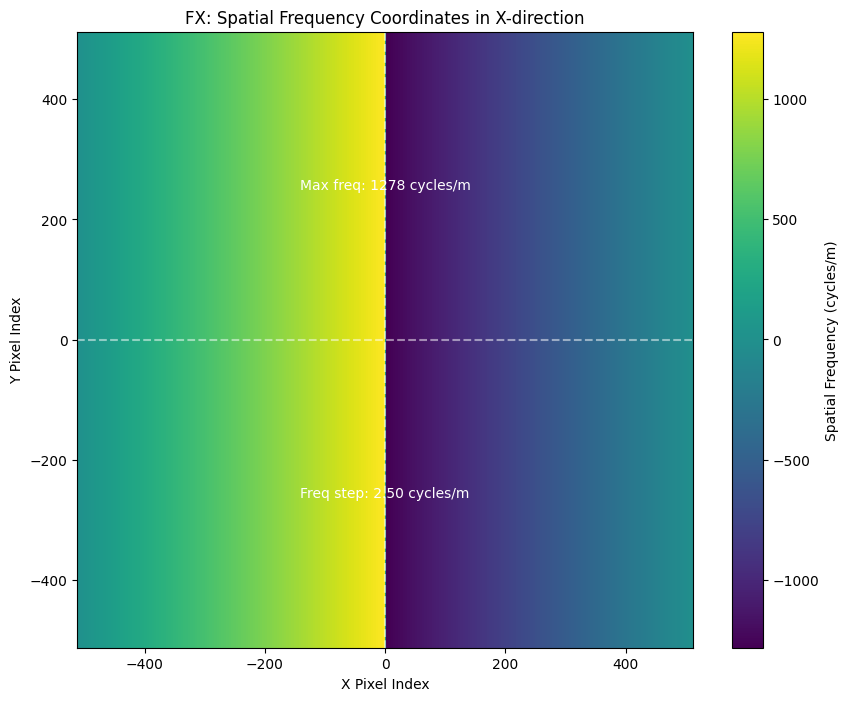

In [10]:
import numpy as np
import matplotlib.pyplot as plt

def plot_FX(xmax, N):
    # Calculate pixel size
    dx = 2 * xmax / N  # pixel size in meters
    
    # Spatial frequencies
    fx = np.fft.fftfreq(N, dx)  # frequency coordinates in cycles/meter
    FX, _ = np.meshgrid(fx, fx)  # We only need FX for this plot
    
    # Create the plot
    plt.figure(figsize=(10, 8))
    plt.imshow(FX, cmap='viridis', extent=[-N/2, N/2, -N/2, N/2])
    plt.colorbar(label='Spatial Frequency (cycles/m)')
    plt.title('FX: Spatial Frequency Coordinates in X-direction')
    plt.xlabel('X Pixel Index')
    plt.ylabel('Y Pixel Index')
    
    # Add some annotations
    plt.axhline(y=0, color='white', linestyle='--', alpha=0.5)
    plt.axvline(x=0, color='white', linestyle='--', alpha=0.5)
    plt.text(0, N/4, f'Max freq: {np.max(fx):.0f} cycles/m', 
             color='white', ha='center', va='center')
    plt.text(0, -N/4, f'Freq step: {fx[1]-fx[0]:.2f} cycles/m', 
             color='white', ha='center', va='center')
    
    plt.show()

# Parameters from validation case
xmax = 0.20  # 20 cm
N = 1024     # pixels per side

plot_FX(xmax, N)

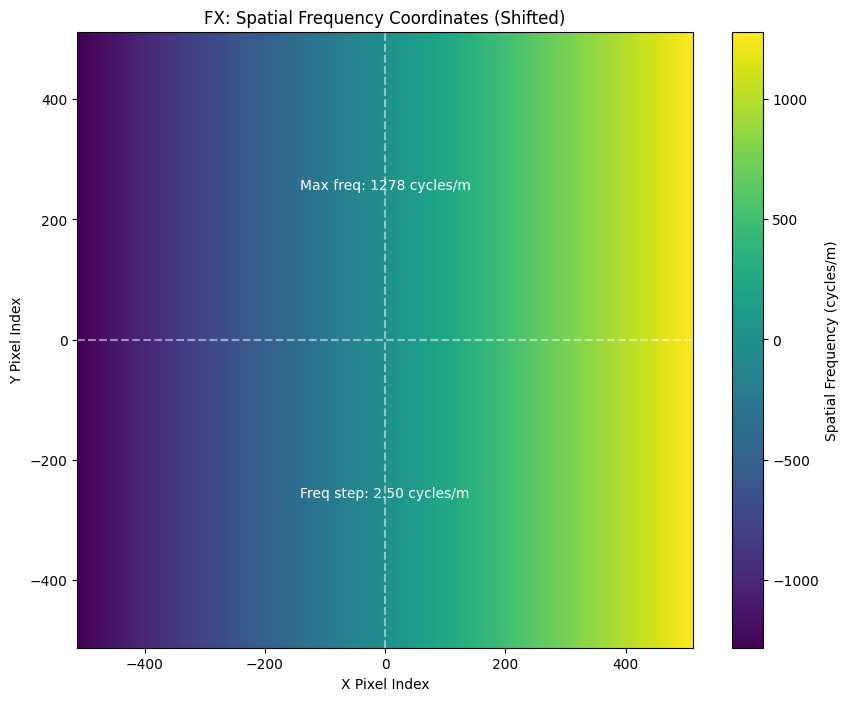

In [11]:
import numpy as np
import matplotlib.pyplot as plt

def plot_FX_shifted(xmax, N):
    dx = 2 * xmax / N
    fx = np.fft.fftfreq(N, dx)
    FX, _ = np.meshgrid(fx, fx)
    
    # Apply fftshift to reorder frequencies
    FX_shifted = np.fft.fftshift(FX)
    
    plt.figure(figsize=(10, 8))
    plt.imshow(FX_shifted, cmap='viridis', extent=[-N/2, N/2, -N/2, N/2])
    plt.colorbar(label='Spatial Frequency (cycles/m)')
    plt.title('FX: Spatial Frequency Coordinates (Shifted)')
    plt.xlabel('X Pixel Index')
    plt.ylabel('Y Pixel Index')
    
    plt.axhline(y=0, color='white', linestyle='--', alpha=0.5)
    plt.axvline(x=0, color='white', linestyle='--', alpha=0.5)
    plt.text(0, N/4, f'Max freq: {np.max(fx):.0f} cycles/m', 
             color='white', ha='center', va='center')
    plt.text(0, -N/4, f'Freq step: {fx[1]-fx[0]:.2f} cycles/m', 
             color='white', ha='center', va='center')
    
    plt.show()

# Parameters
xmax = 0.20  # 20 cm
N = 1024     # pixels per side

plot_FX_shifted(xmax, N)

Question 3(C)

Initial beam width: 399.61 mm
Propagated beam width: 399.61 mm
Width ratio (should be ~2): 1.00
X centroid: -1.26e-14 m
Y centroid: -1.26e-14 m


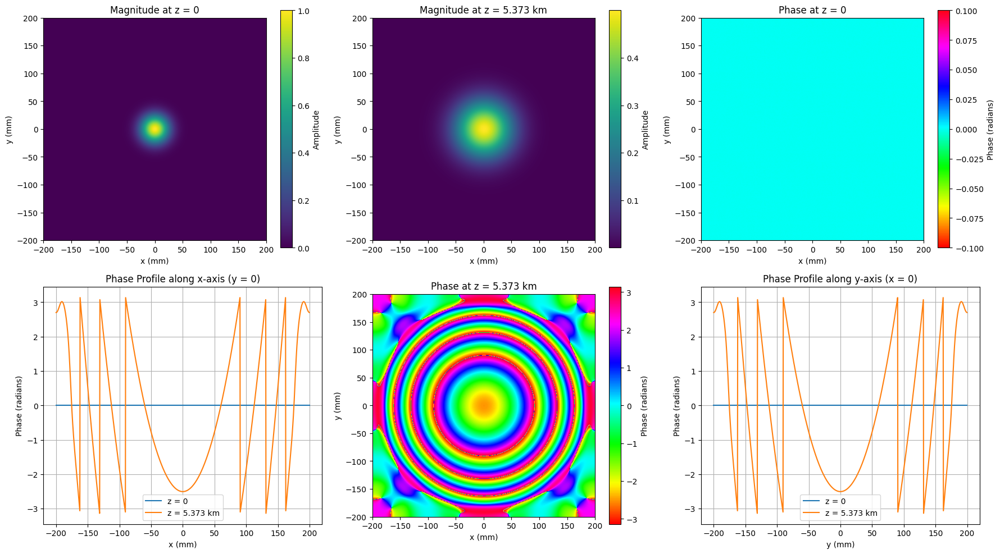

In [16]:
import numpy as np
import matplotlib.pyplot as plt

def angular_spectrum_propagation(E0, wavelength, z, xmax, N):
    """Calculate electric field propagation using angular spectrum method"""
    dx = 2 * xmax / N
    x = np.linspace(-xmax, xmax, N, endpoint=False)
    X, Y = np.meshgrid(x, x)
    
    k = 2 * np.pi / wavelength
    fx = np.fft.fftfreq(N, dx)
    FX, FY = np.meshgrid(fx, fx)
    
    kx = 2 * np.pi * FX
    ky = 2 * np.pi * FY
    kz = np.sqrt(k**2 - kx**2 - ky**2)
    H = np.exp(1j * kz * z)
    H[np.isnan(kz) | (kx**2 + ky**2 > k**2)] = 0
    
    U0 = np.fft.fft2(E0)
    U = U0 * H
    E = np.fft.ifft2(U)
    
    mag = np.abs(E)
    phase = np.angle(E)
    return mag, phase, X, Y

def gaussian_beam(xmax, N, w0):
    """Generate initial Gaussian beam field"""
    dx = 2 * xmax / N
    x = np.linspace(-xmax, xmax, N, endpoint=False)
    X, Y = np.meshgrid(x, x)
    return np.exp(-(X**2 + Y**2) / w0**2)

def verify_propagation_with_phase_and_1d():
    # Parameters
    xmax = 0.20          # 20 cm in meters
    N = 1024             # pixels per side
    wavelength = 633e-9  # 633 nm in meters
    z = 5373             # 5.373 km in meters
    w0 = 0.025           # 25 mm beam waist in meters
    
    # Generate initial field
    E0 = gaussian_beam(xmax, N, w0)
    mag0 = np.abs(E0)
    phase0 = np.angle(E0)  # Phase at z=0 (should be zero for real Gaussian)
    
    # Propagate field
    mag_z, phase_z, X, Y = angular_spectrum_propagation(E0, wavelength, z, xmax, N)
    
    # Calculate beam widths
    center_profile_0 = mag0[N//2, :]
    center_profile_z = mag_z[N//2, :]
    
    max_val_0 = np.max(center_profile_0)
    max_val_z = np.max(center_profile_z)
    threshold_0 = max_val_0 / np.e
    threshold_z = max_val_z / np.e
    
    indices_0 = np.where(center_profile_0 <= threshold_0)[0]
    indices_z = np.where(center_profile_z <= threshold_z)[0]
    x_coords_0 = X[0, indices_0]
    x_coords_z = X[0, indices_z]
    
    width_0 = np.abs(x_coords_0[-1] - x_coords_0[0])
    width_z = np.abs(x_coords_z[-1] - x_coords_z[0])
    
    # Calculate centroid of propagated field
    x_centroid = np.sum(X * mag_z**2) / np.sum(mag_z**2)
    y_centroid = np.sum(Y * mag_z**2) / np.sum(mag_z**2)
    
    # Print results
    print(f"Initial beam width: {width_0*1000:.2f} mm")
    print(f"Propagated beam width: {width_z*1000:.2f} mm")
    print(f"Width ratio (should be ~2): {width_z/width_0:.2f}")
    print(f"X centroid: {x_centroid:.2e} m")
    print(f"Y centroid: {y_centroid:.2e} m")
    
    # Plot 2D magnitude and phase, and 1D phase profiles
    fig, axs = plt.subplots(2, 3, figsize=(18, 10))
    
    # Initial magnitude
    im0 = axs[0, 0].imshow(mag0, extent=[-xmax*1000, xmax*1000, -xmax*1000, xmax*1000], cmap='viridis')
    axs[0, 0].set_title('Magnitude at z = 0')
    axs[0, 0].set_xlabel('x (mm)')
    axs[0, 0].set_ylabel('y (mm)')
    plt.colorbar(im0, ax=axs[0, 0], label='Amplitude')
    
    # Propagated magnitude
    im1 = axs[0, 1].imshow(mag_z, extent=[-xmax*1000, xmax*1000, -xmax*1000, xmax*1000], cmap='viridis')
    axs[0, 1].set_title('Magnitude at z = 5.373 km')
    axs[0, 1].set_xlabel('x (mm)')
    axs[0, 1].set_ylabel('y (mm)')
    plt.colorbar(im1, ax=axs[0, 1], label='Amplitude')
    
    # Initial phase
    im2 = axs[0, 2].imshow(phase0, extent=[-xmax*1000, xmax*1000, -xmax*1000, xmax*1000], cmap='hsv')
    axs[0, 2].set_title('Phase at z = 0')
    axs[0, 2].set_xlabel('x (mm)')
    axs[0, 2].set_ylabel('y (mm)')
    plt.colorbar(im2, ax=axs[0, 2], label='Phase (radians)')
    
    # Propagated phase
    im3 = axs[1, 1].imshow(phase_z, extent=[-xmax*1000, xmax*1000, -xmax*1000, xmax*1000], cmap='hsv')
    axs[1, 1].set_title('Phase at z = 5.373 km')
    axs[1, 1].set_xlabel('x (mm)')
    axs[1, 1].set_ylabel('y (mm)')
    plt.colorbar(im3, ax=axs[1, 1], label='Phase (radians)')
    
    # 1D Phase profile along x-axis (center row, y = 0)
    x_phase_0 = phase0[N//2, :]  # Phase at z=0 along x
    x_phase_z = phase_z[N//2, :]  # Phase at z=5.373 km along x
    axs[1, 0].plot(X[0, :]*1000, x_phase_0, label='z = 0')
    axs[1, 0].plot(X[0, :]*1000, x_phase_z, label='z = 5.373 km')
    axs[1, 0].set_title('Phase Profile along x-axis (y = 0)')
    axs[1, 0].set_xlabel('x (mm)')
    axs[1, 0].set_ylabel('Phase (radians)')
    axs[1, 0].legend()
    axs[1, 0].grid(True)
    
    # 1D Phase profile along y-axis (center column, x = 0)
    y_phase_0 = phase0[:, N//2]  # Phase at z=0 along y
    y_phase_z = phase_z[:, N//2]  # Phase at z=5.373 km along y
    axs[1, 2].plot(Y[:, 0]*1000, y_phase_0, label='z = 0')
    axs[1, 2].plot(Y[:, 0]*1000, y_phase_z, label='z = 5.373 km')
    axs[1, 2].set_title('Phase Profile along y-axis (x = 0)')
    axs[1, 2].set_xlabel('y (mm)')
    axs[1, 2].set_ylabel('Phase (radians)')
    axs[1, 2].legend()
    axs[1, 2].grid(True)
    
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    verify_propagation_with_phase_and_1d()

Initial Beam (z = 0):
Beam width: 399.61 mm
X centroid: -3.64e-20 m, Y centroid: -6.00e-19 m

Diverging Beam (z = +5.373 km):
Beam width: 399.61 mm
Width ratio (vs initial): 1.00
X centroid: -1.26e-14 m, Y centroid: -1.26e-14 m

Converging Beam (z = -5.373 km):
Beam width: 399.61 mm
Width ratio (vs initial): 1.00
X centroid: -1.26e-14 m, Y centroid: -1.26e-14 m


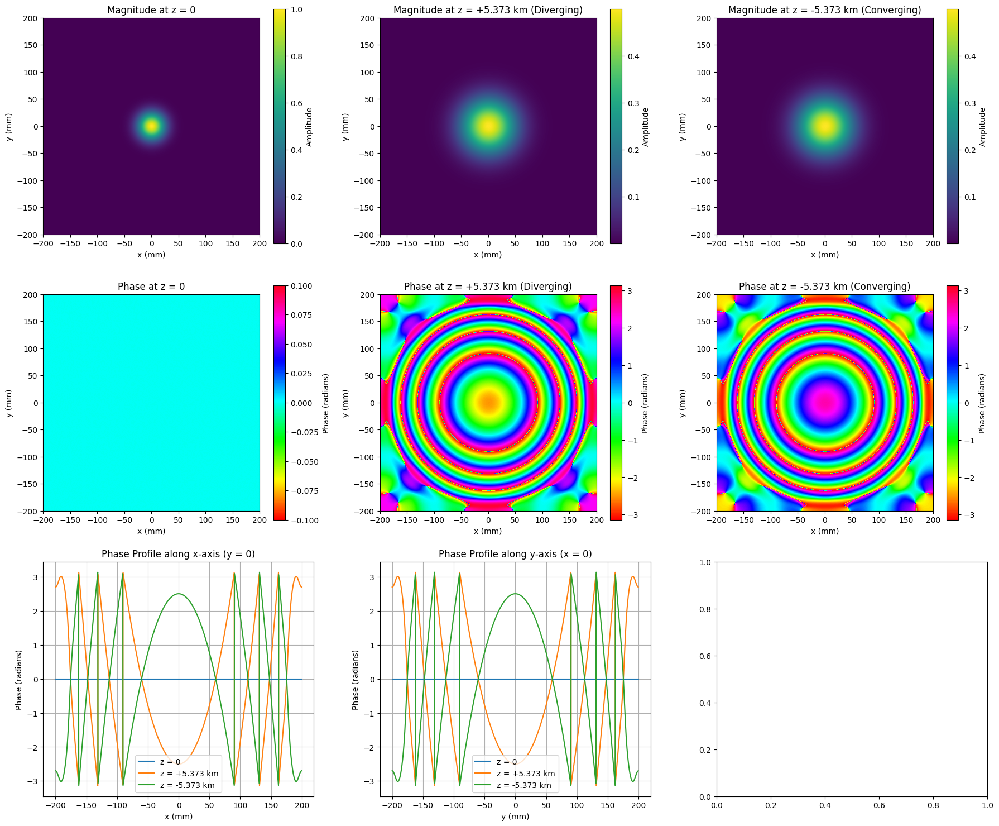

In [17]:
import numpy as np
import matplotlib.pyplot as plt

def angular_spectrum_propagation(E0, wavelength, z, xmax, N):
    """Calculate electric field propagation using angular spectrum method"""
    dx = 2 * xmax / N
    x = np.linspace(-xmax, xmax, N, endpoint=False)
    X, Y = np.meshgrid(x, x)
    
    k = 2 * np.pi / wavelength
    fx = np.fft.fftfreq(N, dx)
    FX, FY = np.meshgrid(fx, fx)
    
    kx = 2 * np.pi * FX
    ky = 2 * np.pi * FY
    kz = np.sqrt(k**2 - kx**2 - ky**2)
    H = np.exp(1j * kz * z)
    H[np.isnan(kz) | (kx**2 + ky**2 > k**2)] = 0
    
    U0 = np.fft.fft2(E0)
    U = U0 * H
    E = np.fft.ifft2(U)
    
    mag = np.abs(E)
    phase = np.angle(E)
    return mag, phase, X, Y

def gaussian_beam(xmax, N, w0):
    """Generate initial Gaussian beam field"""
    dx = 2 * xmax / N
    x = np.linspace(-xmax, xmax, N, endpoint=False)
    X, Y = np.meshgrid(x, x)
    return np.exp(-(X**2 + Y**2) / w0**2)

def verify_propagation_converging_diverging():
    # Parameters
    xmax = 0.20          # 20 cm in meters
    N = 1024             # pixels per side
    wavelength = 633e-9  # 633 nm in meters
    z_diverge = 5373     # 5.373 km diverging (positive z)
    z_converge = -5373   # 5.373 km converging (negative z)
    w0 = 0.025           # 25 mm beam waist in meters
    
    # Generate initial field
    E0 = gaussian_beam(xmax, N, w0)
    mag0 = np.abs(E0)
    phase0 = np.angle(E0)  # Phase at z=0 (should be zero for real Gaussian)
    
    # Propagate for diverging case (z = +5.373 km)
    mag_diverge, phase_diverge, X, Y = angular_spectrum_propagation(E0, wavelength, z_diverge, xmax, N)
    
    # Propagate for converging case (z = -5.373 km)
    mag_converge, phase_converge, _, _ = angular_spectrum_propagation(E0, wavelength, z_converge, xmax, N)
    
    # Calculate beam widths for all cases
    def calculate_width(mag, X):
        center_profile = mag[N//2, :]
        max_val = np.max(center_profile)
        threshold = max_val / np.e
        indices = np.where(center_profile <= threshold)[0]
        x_coords = X[0, indices]
        return np.abs(x_coords[-1] - x_coords[0]) if len(indices) > 1 else 0
    
    width_0 = calculate_width(mag0, X)
    width_diverge = calculate_width(mag_diverge, X)
    width_converge = calculate_width(mag_converge, X)
    
    # Calculate centroids
    def calculate_centroid(mag, X, Y):
        x_centroid = np.sum(X * mag**2) / np.sum(mag**2)
        y_centroid = np.sum(Y * mag**2) / np.sum(mag**2)
        return x_centroid, y_centroid
    
    x_centroid_0, y_centroid_0 = calculate_centroid(mag0, X, Y)
    x_centroid_diverge, y_centroid_diverge = calculate_centroid(mag_diverge, X, Y)
    x_centroid_converge, y_centroid_converge = calculate_centroid(mag_converge, X, Y)
    
    # Print results
    print("Initial Beam (z = 0):")
    print(f"Beam width: {width_0*1000:.2f} mm")
    print(f"X centroid: {x_centroid_0:.2e} m, Y centroid: {y_centroid_0:.2e} m")
    
    print("\nDiverging Beam (z = +5.373 km):")
    print(f"Beam width: {width_diverge*1000:.2f} mm")
    print(f"Width ratio (vs initial): {width_diverge/width_0:.2f}")
    print(f"X centroid: {x_centroid_diverge:.2e} m, Y centroid: {y_centroid_diverge:.2e} m")
    
    print("\nConverging Beam (z = -5.373 km):")
    print(f"Beam width: {width_converge*1000:.2f} mm")
    print(f"Width ratio (vs initial): {width_converge/width_0:.2f}")
    print(f"X centroid: {x_centroid_converge:.2e} m, Y centroid: {y_centroid_converge:.2e} m")
    
    # Plot 2D magnitude and phase for all cases
    fig, axs = plt.subplots(3, 3, figsize=(18, 15))
    
    # Initial magnitude
    im0 = axs[0, 0].imshow(mag0, extent=[-xmax*1000, xmax*1000, -xmax*1000, xmax*1000], cmap='viridis')
    axs[0, 0].set_title('Magnitude at z = 0')
    axs[0, 0].set_xlabel('x (mm)')
    axs[0, 0].set_ylabel('y (mm)')
    plt.colorbar(im0, ax=axs[0, 0], label='Amplitude')
    
    # Diverging magnitude
    im1 = axs[0, 1].imshow(mag_diverge, extent=[-xmax*1000, xmax*1000, -xmax*1000, xmax*1000], cmap='viridis')
    axs[0, 1].set_title('Magnitude at z = +5.373 km (Diverging)')
    axs[0, 1].set_xlabel('x (mm)')
    axs[0, 1].set_ylabel('y (mm)')
    plt.colorbar(im1, ax=axs[0, 1], label='Amplitude')
    
    # Converging magnitude
    im2 = axs[0, 2].imshow(mag_converge, extent=[-xmax*1000, xmax*1000, -xmax*1000, xmax*1000], cmap='viridis')
    axs[0, 2].set_title('Magnitude at z = -5.373 km (Converging)')
    axs[0, 2].set_xlabel('x (mm)')
    axs[0, 2].set_ylabel('y (mm)')
    plt.colorbar(im2, ax=axs[0, 2], label='Amplitude')
    
    # Initial phase
    im3 = axs[1, 0].imshow(phase0, extent=[-xmax*1000, xmax*1000, -xmax*1000, xmax*1000], cmap='hsv')
    axs[1, 0].set_title('Phase at z = 0')
    axs[1, 0].set_xlabel('x (mm)')
    axs[1, 0].set_ylabel('y (mm)')
    plt.colorbar(im3, ax=axs[1, 0], label='Phase (radians)')
    
    # Diverging phase
    im4 = axs[1, 1].imshow(phase_diverge, extent=[-xmax*1000, xmax*1000, -xmax*1000, xmax*1000], cmap='hsv')
    axs[1, 1].set_title('Phase at z = +5.373 km (Diverging)')
    axs[1, 1].set_xlabel('x (mm)')
    axs[1, 1].set_ylabel('y (mm)')
    plt.colorbar(im4, ax=axs[1, 1], label='Phase (radians)')
    
    # Converging phase
    im5 = axs[1, 2].imshow(phase_converge, extent=[-xmax*1000, xmax*1000, -xmax*1000, xmax*1000], cmap='hsv')
    axs[1, 2].set_title('Phase at z = -5.373 km (Converging)')
    axs[1, 2].set_xlabel('x (mm)')
    axs[1, 2].set_ylabel('y (mm)')
    plt.colorbar(im5, ax=axs[1, 2], label='Phase (radians)')
    
    # 1D Phase profile along x-axis (center row, y = 0)
    x_phase_0 = phase0[N//2, :]
    x_phase_diverge = phase_diverge[N//2, :]
    x_phase_converge = phase_converge[N//2, :]
    axs[2, 0].plot(X[0, :]*1000, x_phase_0, label='z = 0')
    axs[2, 0].plot(X[0, :]*1000, x_phase_diverge, label='z = +5.373 km')
    axs[2, 0].plot(X[0, :]*1000, x_phase_converge, label='z = -5.373 km')
    axs[2, 0].set_title('Phase Profile along x-axis (y = 0)')
    axs[2, 0].set_xlabel('x (mm)')
    axs[2, 0].set_ylabel('Phase (radians)')
    axs[2, 0].legend()
    axs[2, 0].grid(True)
    
    # 1D Phase profile along y-axis (center column, x = 0)
    y_phase_0 = phase0[:, N//2]
    y_phase_diverge = phase_diverge[:, N//2]
    y_phase_converge = phase_converge[:, N//2]
    axs[2, 1].plot(Y[:, 0]*1000, y_phase_0, label='z = 0')
    axs[2, 1].plot(Y[:, 0]*1000, y_phase_diverge, label='z = +5.373 km')
    axs[2, 1].plot(Y[:, 0]*1000, y_phase_converge, label='z = -5.373 km')
    axs[2, 1].set_title('Phase Profile along y-axis (x = 0)')
    axs[2, 1].set_xlabel('y (mm)')
    axs[2, 1].set_ylabel('Phase (radians)')
    axs[2, 1].legend()
    axs[2, 1].grid(True)
    
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    verify_propagation_converging_diverging()

Question 3(D)

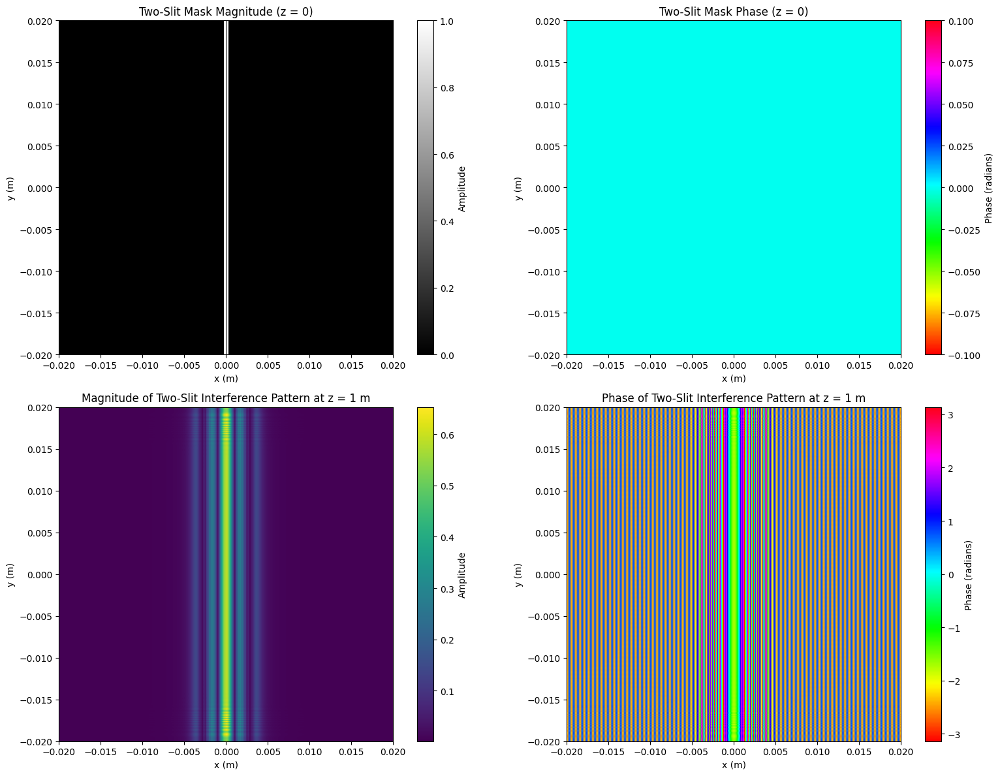

In [1]:
import numpy as np
import matplotlib.pyplot as plt

def angular_spectrum_propagation(E0, wavelength, z, xmax, N):
    """Calculate electric field propagation using angular spectrum method"""
    dx = 2 * xmax / N
    x = np.linspace(-xmax, xmax, N, endpoint=False)
    X, Y = np.meshgrid(x, x)
    
    k = 2 * np.pi / wavelength
    fx = np.fft.fftfreq(N, dx)
    FX, FY = np.meshgrid(fx, fx)
    
    kx = 2 * np.pi * FX
    ky = 2 * np.pi * FY
    kz = np.sqrt(k**2 - kx**2 - ky**2)
    H = np.exp(1j * kz * z)
    H[np.isnan(kz) | (kx**2 + ky**2 > k**2)] = 0
    
    U0 = np.fft.fft2(E0)
    U = U0 * H
    E = np.fft.ifft2(U)
    
    mag = np.abs(E)
    phase = np.angle(E)
    return mag, phase, X, Y

def two_slit_mask(xmax, N, slit_width, slit_spacing):
    """Create a two-slit mask with given slit width and spacing"""
    dx = 2 * xmax / N
    x = np.linspace(-xmax, xmax, N, endpoint=False)
    X, Y = np.meshgrid(x, x)
    
    # Define slit parameters in meters
    slit_width_m = slit_width * 1e-6  # Convert µm to m
    slit_spacing_m = slit_spacing * 1e-6  # Convert µm to m
    
    # Create a mask: slits are vertical, centered at ±slit_spacing/2, with given width
    mask = np.zeros_like(X, dtype=complex)
    slit1_center = -slit_spacing_m / 2
    slit2_center = slit_spacing_m / 2
    
    # Slits are along y, so check x position
    mask[(np.abs(X - slit1_center) < slit_width_m / 2) & (np.abs(Y) < xmax)] = 1
    mask[(np.abs(X - slit2_center) < slit_width_m / 2) & (np.abs(Y) < xmax)] = 1
    
    # Apply uniform illumination (plane wave) through the slits
    return mask

def simulate_two_slit_interference_with_mask_and_phase():
    # Parameters
    xmax = 0.02  # 2 cm = 0.02 m in meters
    N = 512      # pixels per side
    wavelength = 633e-9  # 633 nm in meters
    z = 1.0      # 1 m propagation distance
    slit_width = 250  # 250 µm slit width
    slit_spacing = 250  # 250 µm slit separation
    
    # Create the two-slit mask
    mask = two_slit_mask(xmax, N, slit_width, slit_spacing)
    
    # Propagate the field
    mag, phase, X, Y = angular_spectrum_propagation(mask, wavelength, z, xmax, N)
    
    # Calculate phase of the mask (at z = 0)
    mask_phase = np.angle(mask)
    
    # Plot the mask (magnitude and phase) and interference pattern (magnitude and phase) in SI units (meters)
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(16, 12))
    
    # Plot the mask magnitude
    im1 = ax1.imshow(np.abs(mask), extent=[-xmax, xmax, -xmax, xmax], cmap='gray')
    ax1.set_title('Two-Slit Mask Magnitude (z = 0)')
    ax1.set_xlabel('x (m)')
    ax1.set_ylabel('y (m)')
    plt.colorbar(im1, ax=ax1, label='Amplitude')
    
    # Plot the mask phase
    im2 = ax2.imshow(mask_phase, extent=[-xmax, xmax, -xmax, xmax], cmap='hsv')
    ax2.set_title('Two-Slit Mask Phase (z = 0)')
    ax2.set_xlabel('x (m)')
    ax2.set_ylabel('y (m)')
    plt.colorbar(im2, ax=ax2, label='Phase (radians)')
    
    # Plot the magnitude of the observed field after propagation
    im3 = ax3.imshow(mag, extent=[-xmax, xmax, -xmax, xmax], cmap='viridis')
    ax3.set_title('Magnitude of Two-Slit Interference Pattern at z = 1 m')
    ax3.set_xlabel('x (m)')
    ax3.set_ylabel('y (m)')
    plt.colorbar(im3, ax=ax3, label='Amplitude')
    
    # Plot the phase of the observed field after propagation
    im4 = ax4.imshow(phase, extent=[-xmax, xmax, -xmax, xmax], cmap='hsv')
    ax4.set_title('Phase of Two-Slit Interference Pattern at z = 1 m')
    ax4.set_xlabel('x (m)')
    ax4.set_ylabel('y (m)')
    plt.colorbar(im4, ax=ax4, label='Phase (radians)')
    
    plt.tight_layout()
    plt.show()
    

if __name__ == "__main__":
    simulate_two_slit_interference_with_mask_and_phase()

Ignore below for personal experimentation

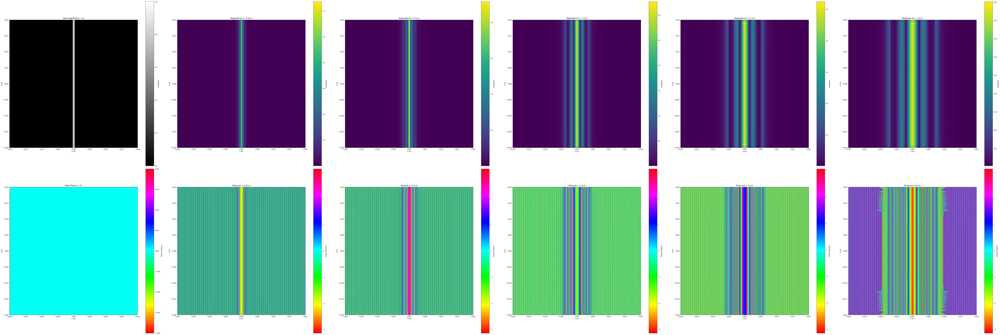

In [2]:
import numpy as np
import matplotlib.pyplot as plt

def angular_spectrum_propagation(E0, wavelength, z, xmax, N):
    """Calculate electric field propagation using angular spectrum method"""
    dx = 2 * xmax / N
    x = np.linspace(-xmax, xmax, N, endpoint=False)
    X, Y = np.meshgrid(x, x)
    
    k = 2 * np.pi / wavelength
    fx = np.fft.fftfreq(N, dx)
    FX, FY = np.meshgrid(fx, fx)
    
    kx = 2 * np.pi * FX
    ky = 2 * np.pi * FY
    kz = np.sqrt(k**2 - kx**2 - ky**2)
    H = np.exp(1j * kz * z)
    H[np.isnan(kz) | (kx**2 + ky**2 > k**2)] = 0
    
    U0 = np.fft.fft2(E0)
    U = U0 * H
    E = np.fft.ifft2(U)
    
    mag = np.abs(E)
    phase = np.angle(E)
    return mag, phase, X, Y

def two_slit_mask(xmax, N, slit_width, slit_spacing):
    """Create a two-slit mask with given slit width and spacing"""
    dx = 2 * xmax / N
    x = np.linspace(-xmax, xmax, N, endpoint=False)
    X, Y = np.meshgrid(x, x)
    
    # Define slit parameters in meters
    slit_width_m = slit_width * 1e-6  # Convert µm to m
    slit_spacing_m = slit_spacing * 1e-6  # Convert µm to m
    
    # Create a mask: slits are vertical, centered at ±slit_spacing/2, with given width
    mask = np.zeros_like(X, dtype=complex)
    slit1_center = -slit_spacing_m / 2
    slit2_center = slit_spacing_m / 2
    
    # Slits are along y, so check x position
    mask[(np.abs(X - slit1_center) < slit_width_m / 2) & (np.abs(Y) < xmax)] = 1
    mask[(np.abs(X - slit2_center) < slit_width_m / 2) & (np.abs(Y) < xmax)] = 1
    
    # Apply uniform illumination (plane wave) through the slits
    return mask

def simulate_two_slit_interference_with_mask_and_phase_custom_z():
    # Parameters
    xmax = 0.02  # 2 cm = 0.02 m in meters
    N = 512      # pixels per side
    wavelength = 633e-9  # 633 nm in meters
    slit_width = 250  # 250 µm slit width
    slit_spacing = 250  # 250 µm slit separation
    
    # Custom list of z values (in meters)
    z_list = [0.25, 0.5, 1.0, 1.5, 2.0]
    n_z = len(z_list)
    
    # Create the two-slit mask
    mask = two_slit_mask(xmax, N, slit_width, slit_spacing)
    
    # Calculate mask phase once
    mask_phase = np.angle(mask)
    
    # Create a figure with 2 rows and (n_z + 1) columns (mask + n_z propagation plots)
    fig, axs = plt.subplots(2, n_z + 1, figsize=(16 * (n_z + 1), 32))
    
    # Plot mask magnitude and phase (first column)
    # Mask Magnitude
    im1 = axs[0, 0].imshow(np.abs(mask), extent=[-xmax, xmax, -xmax, xmax], cmap='gray')
    axs[0, 0].set_title('Mask Magnitude (z = 0)')
    axs[0, 0].set_xlabel('x (m)')
    axs[0, 0].set_ylabel('y (m)')
    plt.colorbar(im1, ax=axs[0, 0], label='Amplitude')
    
    # Mask Phase
    im2 = axs[1, 0].imshow(mask_phase, extent=[-xmax, xmax, -xmax, xmax], cmap='hsv')
    axs[1, 0].set_title('Mask Phase (z = 0)')
    axs[1, 0].set_xlabel('x (m)')
    axs[1, 0].set_ylabel('y (m)')
    plt.colorbar(im2, ax=axs[1, 0], label='Phase (radians)')
    
    # Propagate and plot for each z in z_list
    for i, z in enumerate(z_list):
        # Propagate the field
        mag, phase, _, _ = angular_spectrum_propagation(mask, wavelength, z, xmax, N)
        
        # Plot magnitude
        im3 = axs[0, i + 1].imshow(mag, extent=[-xmax, xmax, -xmax, xmax], cmap='viridis')
        axs[0, i + 1].set_title(f'Magnitude at z = {z} m')
        axs[0, i + 1].set_xlabel('x (m)')
        axs[0, i + 1].set_ylabel('y (m)')
        plt.colorbar(im3, ax=axs[0, i + 1], label='Amplitude')
        
        # Plot phase
        im4 = axs[1, i + 1].imshow(phase, extent=[-xmax, xmax, -xmax, xmax], cmap='hsv')
        axs[1, i + 1].set_title(f'Phase at z = {z} m')
        axs[1, i + 1].set_xlabel('x (m)')
        axs[1, i + 1].set_ylabel('y (m)')
        plt.colorbar(im4, ax=axs[1, i + 1], label='Phase (radians)')
    
    plt.tight_layout()
    plt.show()
    

if __name__ == "__main__":
    simulate_two_slit_interference_with_mask_and_phase_custom_z()

z = 0.25 m: Min phase difference = 0.0000, Max phase difference = 6.2829
z = 0.5 m: Min phase difference = 0.0002, Max phase difference = 6.2832
z = 1.0 m: Min phase difference = 0.0000, Max phase difference = 6.2831
z = 1.5 m: Min phase difference = 0.0000, Max phase difference = 6.2832
z = 2.0 m: Min phase difference = 0.0000, Max phase difference = 6.2831


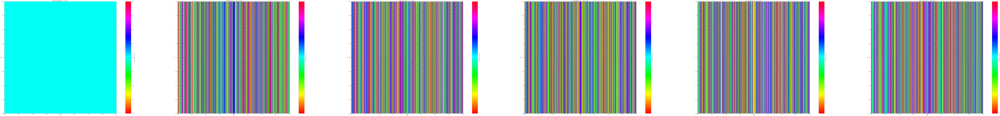

In [3]:
import numpy as np
import matplotlib.pyplot as plt

def angular_spectrum_propagation(E0, wavelength, z, xmax, N):
    """Calculate electric field propagation using angular spectrum method"""
    dx = 2 * xmax / N
    x = np.linspace(-xmax, xmax, N, endpoint=False)
    X, Y = np.meshgrid(x, x)
    
    k = 2 * np.pi / wavelength
    fx = np.fft.fftfreq(N, dx)
    FX, FY = np.meshgrid(fx, fx)
    
    kx = 2 * np.pi * FX
    ky = 2 * np.pi * FY
    kz = np.sqrt(k**2 - kx**2 - ky**2)
    H = np.exp(1j * kz * z)
    H[np.isnan(kz) | (kx**2 + ky**2 > k**2)] = 0
    
    U0 = np.fft.fft2(E0)
    U = U0 * H
    E = np.fft.ifft2(U)
    
    mag = np.abs(E)
    phase = np.angle(E)
    return mag, phase, X, Y

def two_slit_mask(xmax, N, slit_width, slit_spacing):
    """Create a two-slit mask with given slit width and spacing"""
    dx = 2 * xmax / N
    x = np.linspace(-xmax, xmax, N, endpoint=False)
    X, Y = np.meshgrid(x, x)
    
    # Define slit parameters in meters
    slit_width_m = slit_width * 1e-6  # Convert µm to m
    slit_spacing_m = slit_spacing * 1e-6  # Convert µm to m
    
    # Create a mask: slits are vertical, centered at ±slit_spacing/2, with given width
    mask = np.zeros_like(X, dtype=complex)
    slit1_center = -slit_spacing_m / 2
    slit2_center = slit_spacing_m / 2
    
    # Slits are along y, so check x position
    mask[(np.abs(X - slit1_center) < slit_width_m / 2) & (np.abs(Y) < xmax)] = 1
    mask[(np.abs(X - slit2_center) < slit_width_m / 2) & (np.abs(Y) < xmax)] = 1
    
    # Apply uniform illumination (plane wave) through the slits
    return mask

def simulate_2d_phase_difference_plots_0_to_2pi():
    # Parameters
    xmax = 0.02  # 2 cm = 0.02 m in meters
    N = 512      # pixels per side
    wavelength = 633e-9  # 633 nm in meters
    slit_width = 250  # 250 µm slit width
    slit_spacing = 250  # 250 µm slit separation
    
    # Custom list of z values (in meters)
    z_list = [0.25, 0.5, 1.0, 1.5, 2.0]
    n_z = len(z_list)
    
    # Create the two-slit mask
    mask = two_slit_mask(xmax, N, slit_width, slit_spacing)
    
    # Calculate mask phase once (at z = 0)
    _, mask_phase, X, Y = angular_spectrum_propagation(mask, wavelength, 0, xmax, N)
    
    # Create a single figure with larger 2D subplots for phase difference in [0, 2π]
    fig, axs = plt.subplots(1, n_z + 1, figsize=(36 * (n_z + 1), 24))
    
    # Plot mask phase difference in 2D (phase difference relative to itself is 0, in [0, 2π])
    phase_diff_mask = np.zeros_like(mask_phase)  # Start with 0
    phase_diff_mask = phase_diff_mask % (2 * np.pi)  # Ensure in [0, 2π]
    im1 = axs[0].imshow(phase_diff_mask, extent=[-xmax, xmax, -xmax, xmax], cmap='hsv')
    axs[0].set_title('Mask Phase Difference (z = 0, [0, 2π])')
    axs[0].set_xlabel('x (m)')
    axs[0].set_ylabel('y (m)')
    plt.colorbar(im1, ax=axs[0], label='Phase Difference (radians)')
    
    # Propagate and plot phase difference in 2D for each z in z_list, wrapped to [0, 2π]
    for i, z in enumerate(z_list):
        # Propagate the field
        mag, phase, _, _ = angular_spectrum_propagation(mask, wavelength, z, xmax, N)
        
        # Calculate phase difference relative to mask phase
        phase_diff = phase - mask_phase
        
        # Wrap phase difference to [0, 2π] radians
        phase_diff = (phase_diff + 2 * np.pi) % (2 * np.pi)  # Wrap to [0, 2π]
        
        print(f"z = {z} m: Min phase difference = {np.min(phase_diff):.4f}, Max phase difference = {np.max(phase_diff):.4f}")
        
        # Plot phase difference in 2D
        im2 = axs[i + 1].imshow(phase_diff, extent=[-xmax, xmax, -xmax, xmax], cmap='hsv')
        axs[i + 1].set_title(f'Phase Difference at z = {z} m ([0, 2π])')
        axs[i + 1].set_xlabel('x (m)')
        axs[i + 1].set_ylabel('y (m)')
        plt.colorbar(im2, ax=axs[i + 1], label='Phase Difference (radians)')
    
    plt.tight_layout()
    plt.show()
    


if __name__ == "__main__":
    simulate_2d_phase_difference_plots_0_to_2pi()